In [1]:
!which python

/c/Users/junec/AppData/Local/Programs/Python/Python38/python


In [2]:
import struct 
struct.calcsize("P")*8

32

In [3]:
# !pip list

In [4]:
# !pip install openpyxl

In [5]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple

In [6]:
from util import load_data_from_txt, calculate_derivative
from baseline import detect_breakpoints, detect_breakpoints_2, detect_breakpoints_3, detect_breakpoints_all
from plot import group_index, plot_4_metrics,plot_4_metrics_details

In [7]:
pressure_file="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_file="../data_input/EAGE_Shchipanov_2017/Rate.txt"
pressure_df,rate_df,pressure_rate=load_data_from_txt(pressure_file, rate_file)
display(pressure_df)
display(rate_df)
# pressure_rate

,Elapsed time,Data
0,0.000000,2988.99
1,0.495833,2991.28
2,0.516667,2994.32
3,0.545833,2996.70
4,0.566667,2999.12
...,...,...
29808,4063.495571,7938.65
29809,4065.499737,7939.53
29810,4067.503904,7940.92
29811,4069.508071,7941.22


,Elapsed time,Liquid rate
0,0.433384,-3916.602731
1,2.516718,-3913.489043
2,4.600051,-3911.804387
3,6.641718,-3910.573563
4,7.683384,-3907.017652
...,...,...
10186,4074.862089,-18459.075655
10187,4075.028756,-18423.899451
10188,4075.237089,-18412.745895
10189,4075.362089,-18413.519153


In [8]:
#calculate first & second derivative

x_coordinate=pressure_df["Elapsed time"]
y_coordinate=pressure_df["Data"]
first_order_derivative=calculate_derivative(x_coordinate,y_coordinate)

x_coordinate=pressure_df["Elapsed time"]
y_coordinate=first_order_derivative
second_order_derivative=calculate_derivative(x_coordinate,y_coordinate)

#add first and second derivative to pressure_df dataframe
pressure_df["first_order_derivative"]=first_order_derivative
pressure_df["second_order_derivative"]=second_order_derivative
# pd.set_option('display.max_rows', pressure_df.shape[0]+1)
display(pressure_df)

,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
29808,4063.495571,7938.65,0.439085,0.126970
29809,4065.499737,7939.53,0.693555,-0.271368
29810,4067.503904,7940.92,0.149688,-0.123142
29811,4069.508071,7941.22,-0.097110,0.000000


In [9]:
breakpoints=detect_breakpoints(first_order_derivative,second_order_derivative)
print(len(breakpoints))
# print(breakpoints)


993.2336512455328
39


In [10]:
breakpoints=detect_breakpoints_2(first_order_derivative)
print(len(breakpoints))
# print(breakpoints)

993.2336512455328
53


In [11]:
breakpoints=detect_breakpoints_3(first_order_derivative,second_order_derivative)
print(len(breakpoints))
# print(breakpoints)
# denoised_first_order_derivative.append(first_order_derivative[-1])
# print(len(denoised_first_order_derivative))
# pressure_df["denoised_first_order_derivative"]=denoised_first_order_derivative

pressure_df
# display(pressure_df.loc[0:1592])

993.2336512455328 192914.8008199997
53


,Elapsed time,Data,first_order_derivative,second_order_derivative
0,0.000000,2988.99,4.618487,284.977831
1,0.495833,2991.28,145.919995,-3087.359588
2,0.516667,2994.32,81.600002,1184.914121
3,0.545833,2996.70,116.159996,-1817.279726
4,0.566667,2999.12,78.300001,-168.428622
...,...,...,...,...
29808,4063.495571,7938.65,0.439085,0.126970
29809,4065.499737,7939.53,0.693555,-0.271368
29810,4067.503904,7940.92,0.149688,-0.123142
29811,4069.508071,7941.22,-0.097110,0.000000


In [12]:
breakpoints_all=detect_breakpoints_all(first_order_derivative)
print(len(breakpoints_all))
print(breakpoints_all)

105
[64, 65, 2252, 2253, 4891, 5771, 5772, 6544, 6545, 8605, 8606, 9620, 9621, 9623, 9624, 9626, 9627, 9641, 9642, 11484, 11485, 13040, 13041, 13051, 13052, 13549, 13550, 15433, 15434, 18457, 18458, 18460, 18461, 18464, 18465, 18815, 18816, 18818, 18819, 18824, 18825, 18830, 18831, 18847, 18848, 18893, 18894, 20362, 20363, 20368, 20369, 20371, 20372, 20380, 20381, 20386, 20387, 22183, 22184, 24264, 24265, 24687, 24688, 24690, 24691, 24764, 24765, 24768, 24769, 24772, 24773, 24775, 24776, 26019, 26020, 26022, 26023, 26025, 26504, 26505, 26507, 26783, 26784, 26792, 26793, 26795, 26796, 26814, 26815, 26841, 26842, 27316, 27317, 27963, 27964, 28243, 28244, 29122, 29123, 29125, 29126, 29547, 29548, 29550, 29551]


findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


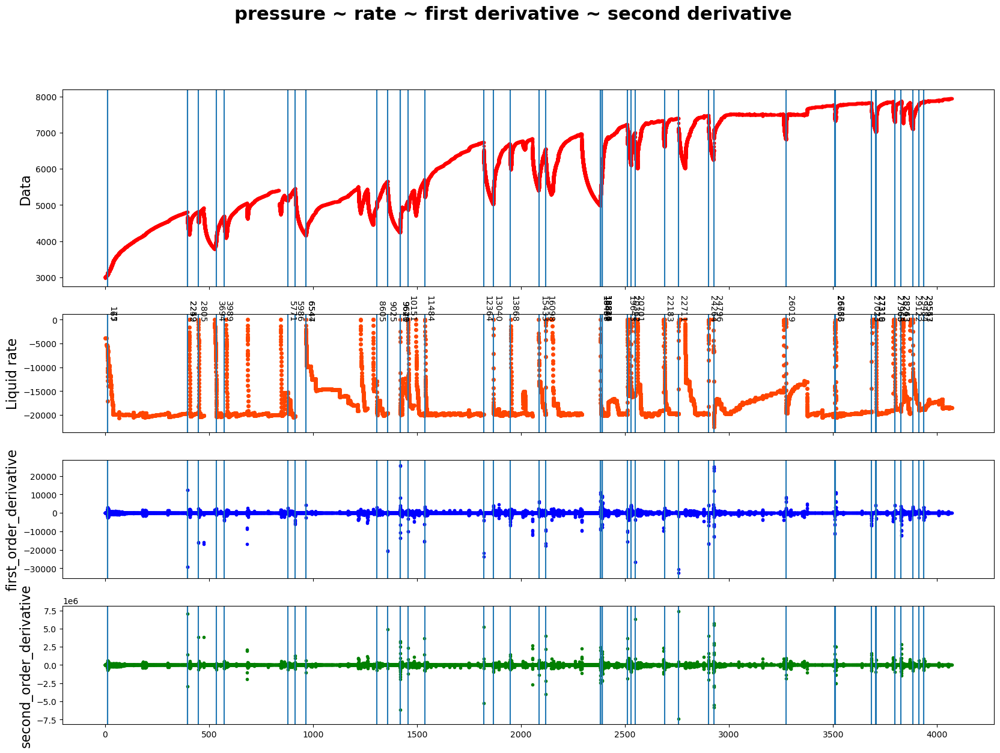

In [13]:
colum_names ={"pressure":["Elapsed time","Data","first_order_derivative","second_order_derivative"],
                    "rate":["Elapsed time","Liquid rate"]}
plot_4_metrics(pressure_df,
               rate_df,
               breakpoints,colum_names)

100


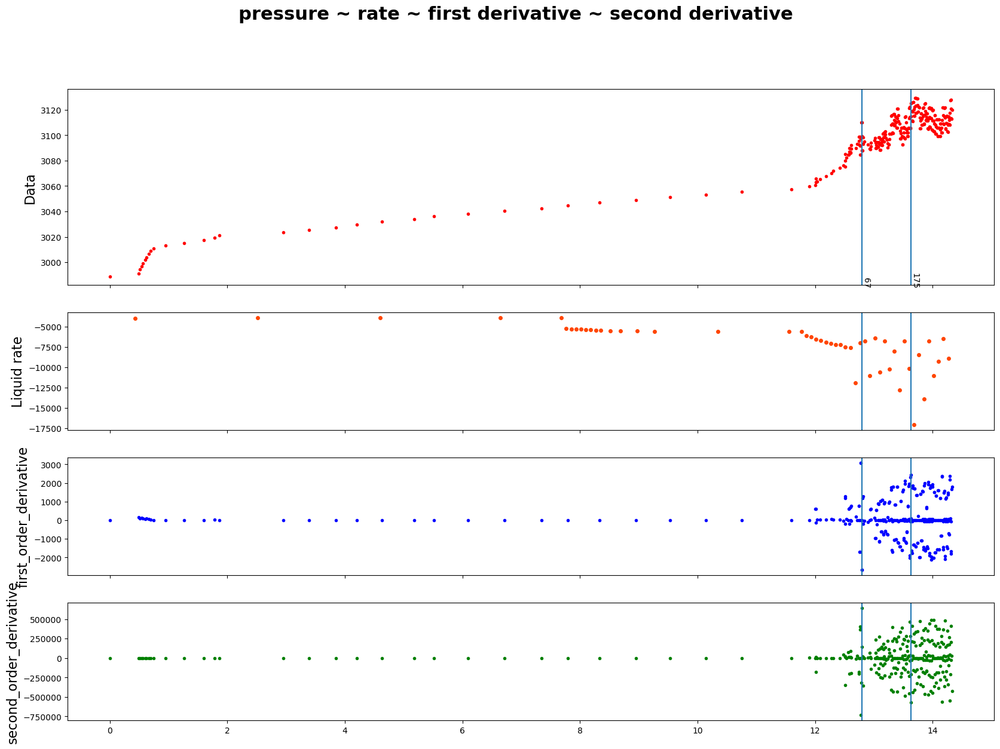

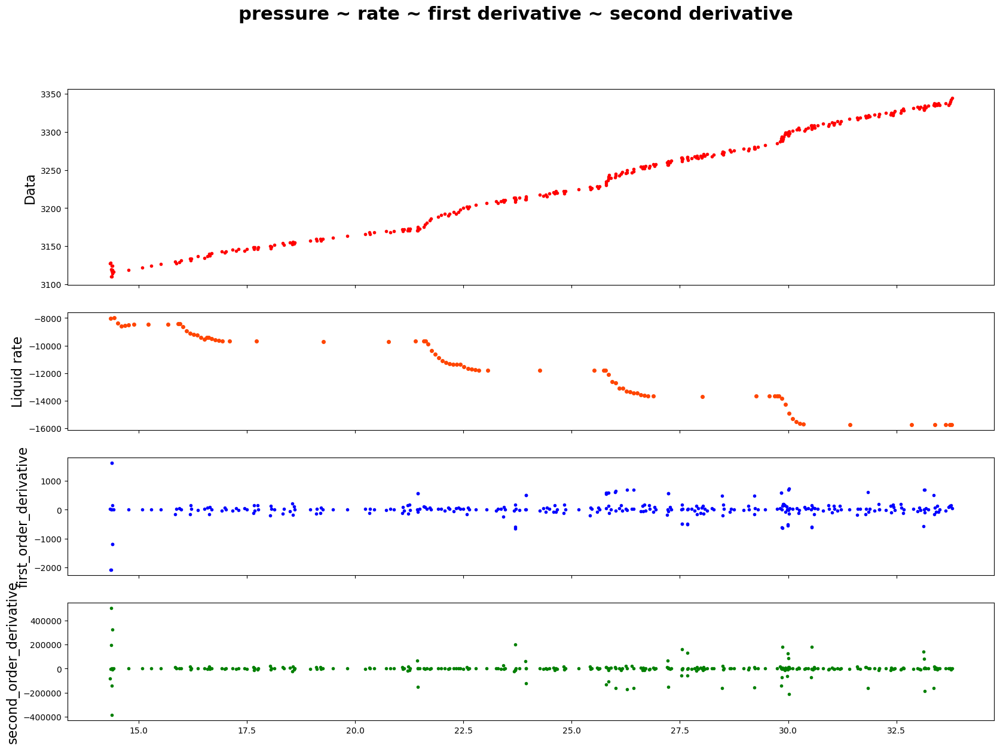

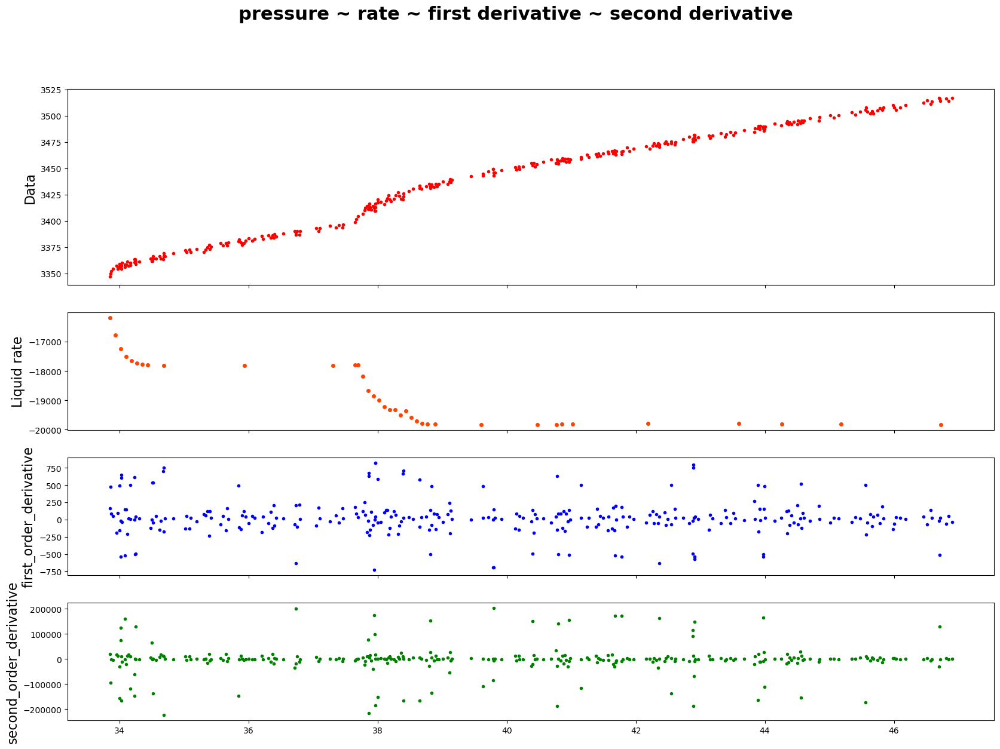

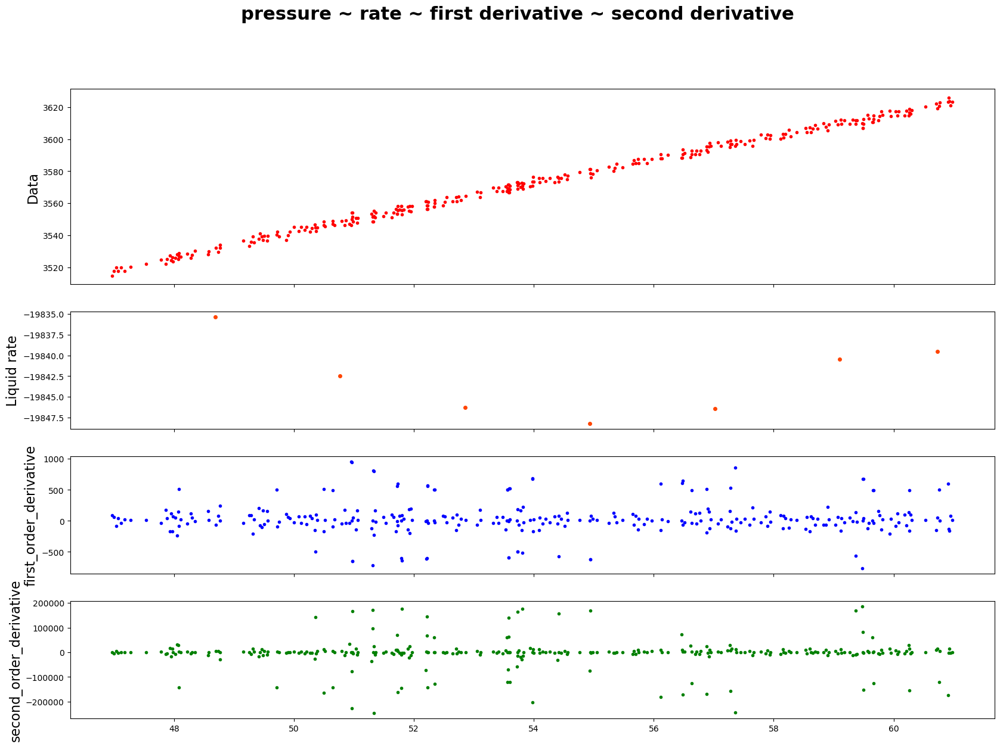

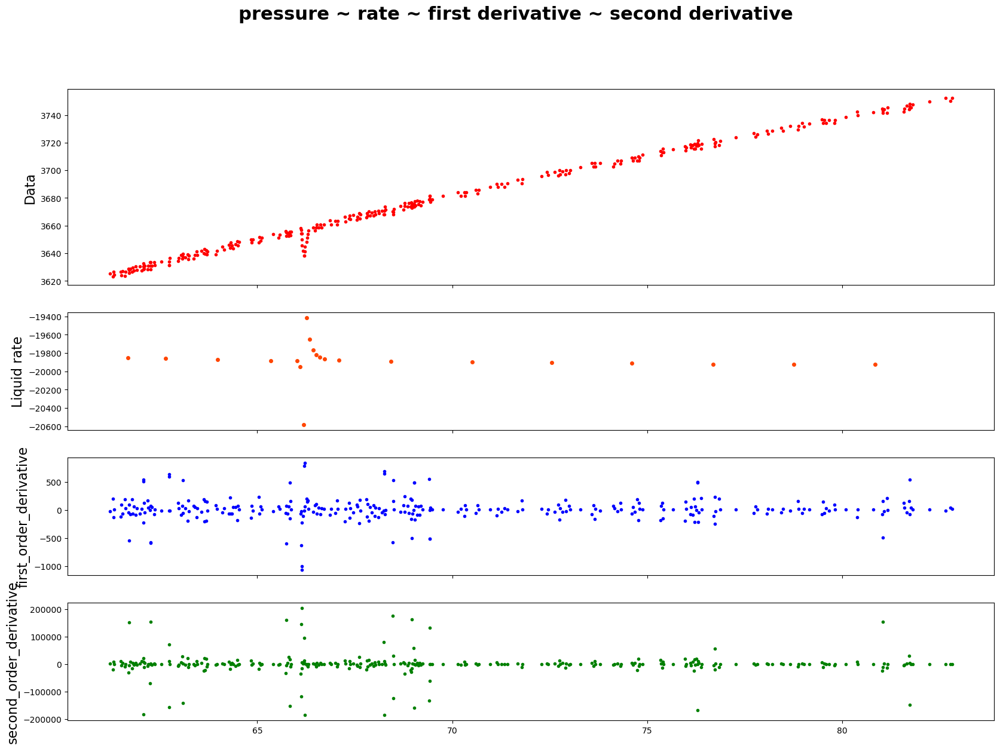

...

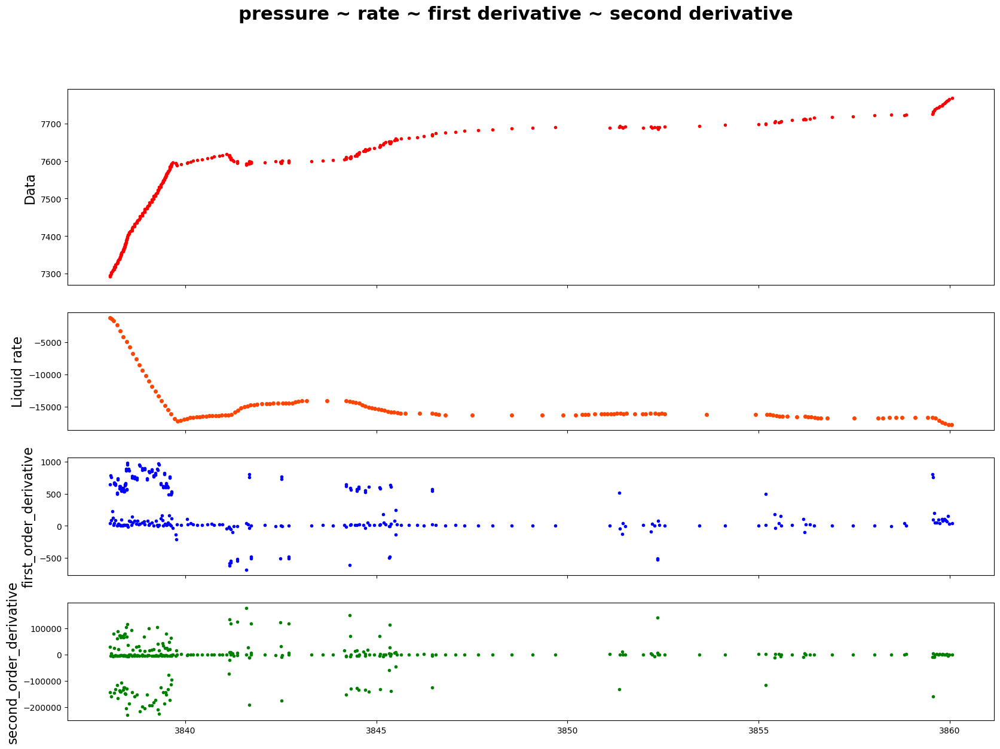

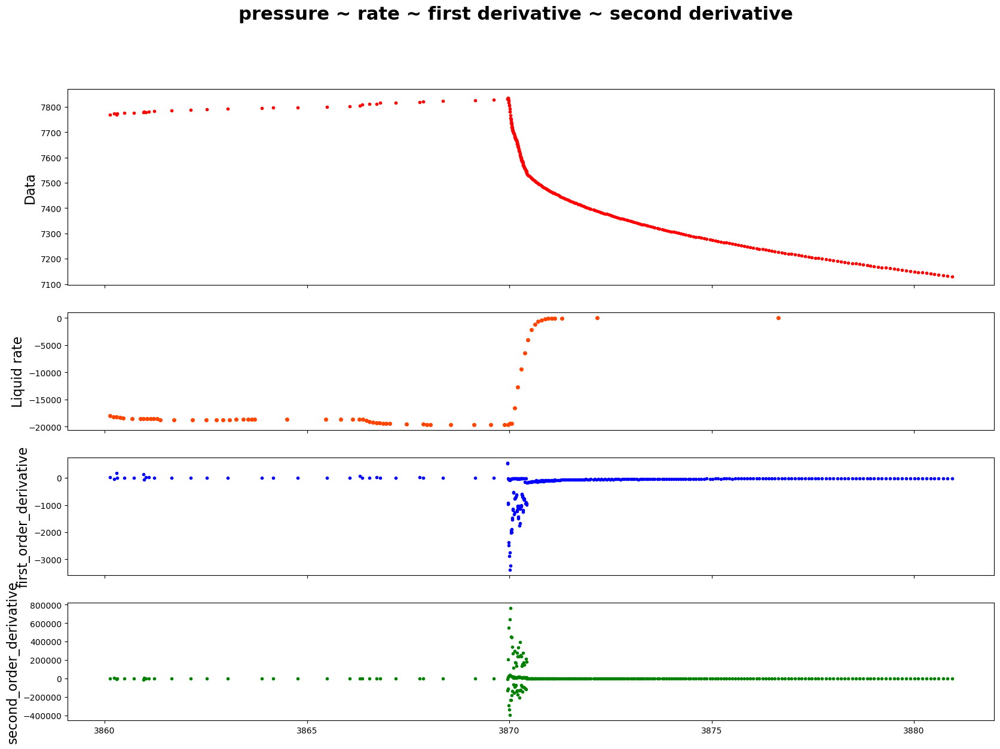

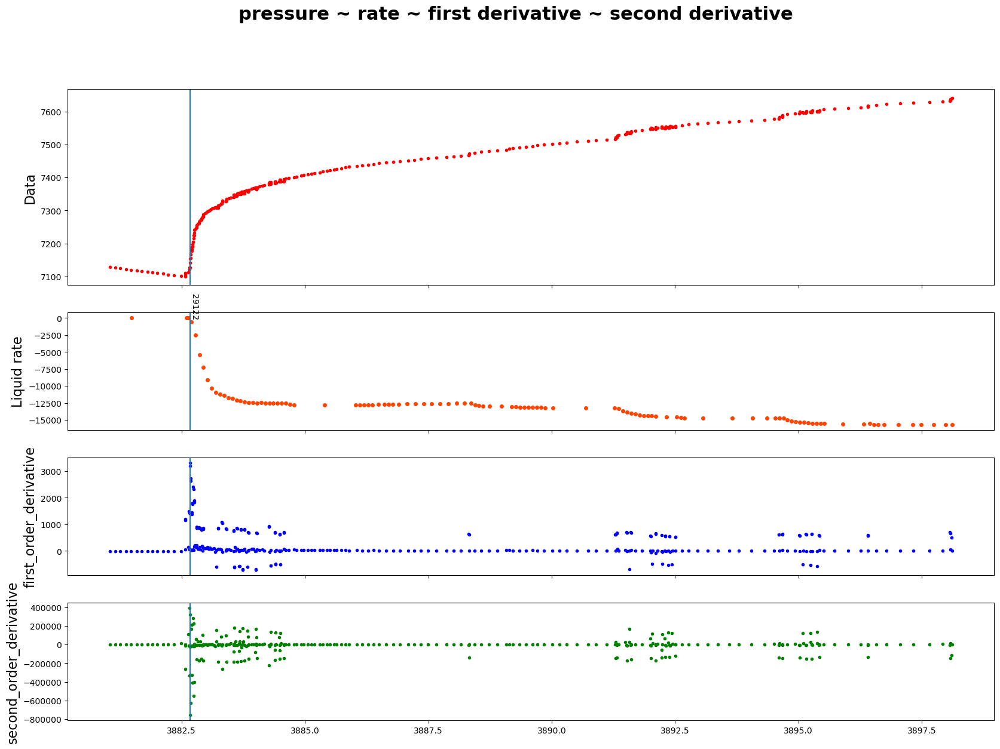

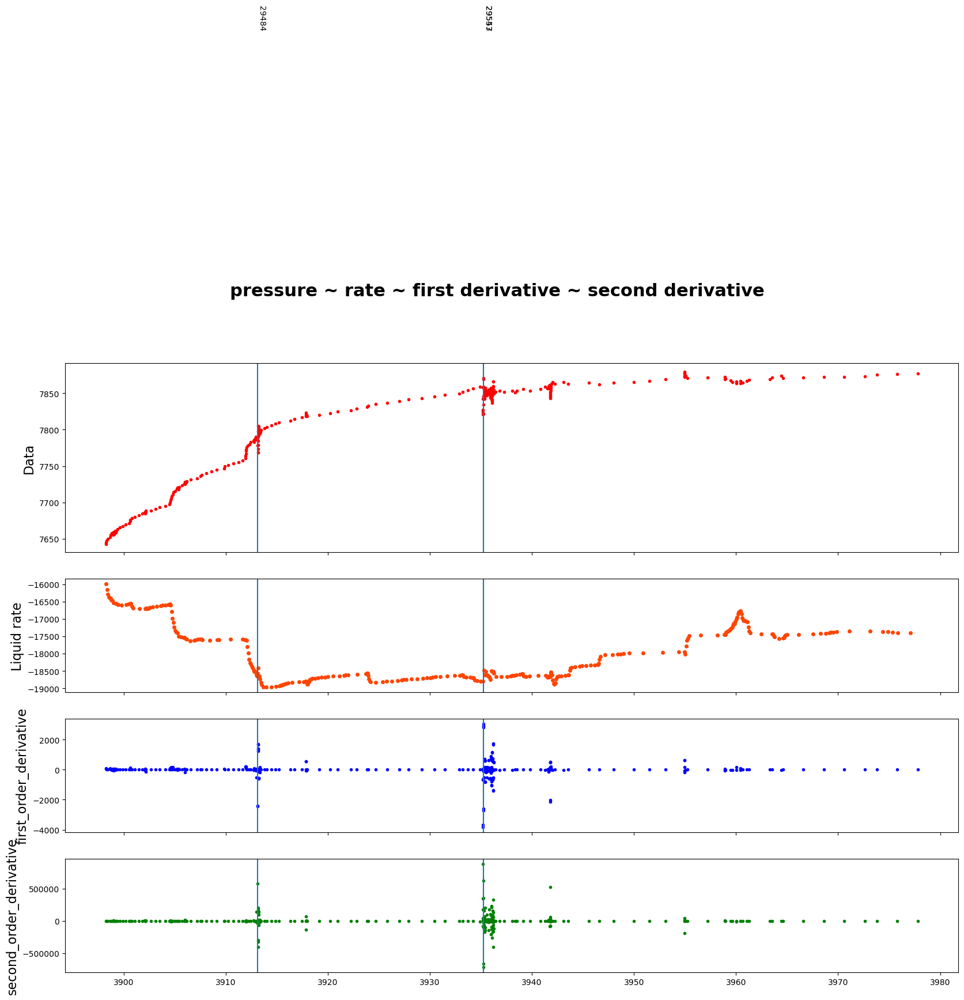

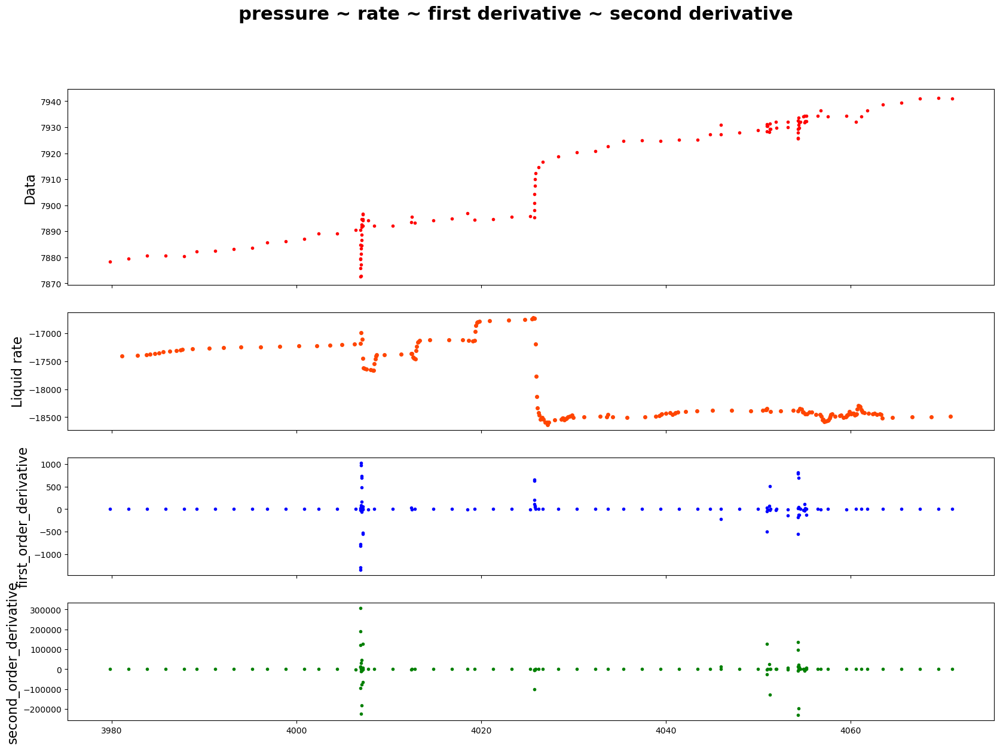

count_breakpoints 53


In [14]:
data_inOneRow=300
plot_4_metrics_details(data_inOneRow,
                           pressure_df,
                           rate_df,
                           breakpoints,colum_names)